# Moscow restaurants

## Описание проекта  

Investors from the Shut Up and Take My Money fund have decided to try their hand at a new venture and open a restaurant in Moscow. The clients do not yet know what kind of place it will be: a café, restaurant, pizzeria, pub, or bar—nor do they know the location, menu, or prices.  

To start with, they are asking you, the analyst, to conduct market research in Moscow, identify interesting features, and present the results, which will help them choose a location that suits investors in the future.    

Try to make the presentation informative and concise. Its structure and design greatly influence how readers perceive the information in your research. You can choose the tools (matplotlib, seaborn, and others) and types of visualizations yourself.   

You have access to a dataset of Moscow's public catering establishments, compiled based on data from Yandex Maps and Yandex Business for the summer of 2022. The information posted on Yandex Business may have been added by users or found in publicly available sources. It is for reference purposes only.


## Описание данных 
Файл `moscow_places.csv`:  
`name` — название заведения;  
`address` — адрес заведения;  
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
`hours` — информация о днях и часах работы;  
`lat` — широта географической точки, в которой находится заведение;  
`lng` — долгота географической точки, в которой находится заведение;  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
* «Средний счёт: 1000–1500 ₽»;  
* «Цена чашки капучино: 130–220 ₽»;  
* «Цена бокала пива: 400–600 ₽».  
и так далее;  

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
0 — заведение не является сетевым  
1 — заведение является сетевым  
`district` — административный район, в котором находится заведение, например Центральный административный округ;  
`seats` — количество посадочных мест.   


## План работы 
1. Изучение общей информации об имеющемся датасете (посмотрим [объем данных](#шаг_1), какая информация нам доступна и какие проблемы необходимо решить перед исследовательским анализом)
2. [Предобработка](#шаг-2-выполните-предобработку-данных) (заменим формат данных, если необходимо, добавим необходимые для исследования столбцы, обработаем дубликаты и пропущенные значения)
3. [Исследовательский анализ для заведений общепита Москвы](#шаг-3-анализ-данных) (проанализируем, какие категории заведений представлены, число посадочных мест, найдем топ-15 популярных сетей, проанализируем административные районы, изучим рейтинг по категориям заведений, найдем топ-15 улиц по числу заведений, а также улицы, на которых только одно заведение, проанализируем средние чеки, график работы заведений и изучим влияние расстояния до метро)  
4. [Детализируем исследование для кофеен](#шаг-4-детализируем-исследование-открытие-кофейни) (посмотрим, сколько всего кофеен в датасете, как они распределены по районам, изучим круглосуточные кофейни, рейтинги кофеен и как они распределены по районам, а также ответим, на какую стоимость чашки кофе ориентироваться и как расстояние до метро влияет на кофейни)  
5. Сделаем выводы по анализу [заведений общепита](#вывод-по-заведениям-общепита-в-москве) и, отдельно, [для кофеен](#вывод-по-кофейням)  

### Презентация по результатам исследования
Презентация: <https://drive.google.com/file/d/1PCWJZCNKcn4fSLuH7ig-NB6Z--0ylavz/view?usp=sharing>

## Шаг 1. Откроем файл с данными и изучим общую информацию
<a id='шаг_1'></a>

In [1]:
# импортируем библиотеки, необходимые для работы
import pandas as pd
import numpy as np
import sys
# инструменты визуализаций
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
# подключаем модуль для работы с JSON-форматом
import json
# импортируем карту и хороплет
from folium import Map, Choropleth
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
import xml.etree.ElementTree as ET # библиотека для чтения xml файлов

In [2]:
# загрузим датасеты

try:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')  # данные по заведениям
    
except:
    df = pd.read_csv('/Users/darianechaeva/yandex_data_analyst/moscow_places.csv')  # данные по заведениям  

In [3]:
#Изучим общую информацию о датафреймах    
def print_info_and_sample(data):
    data.info()
    print('*'*50)
    display(data.sample(10, random_state=1))
    
print_info_and_sample(df)

print(f'\033[1mОбщее число строк в датафрейме: {df.shape[0]}\033[1m')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
**************************************************


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1615,Cedro Albero,пиццерия,"Москва, 4-й Вятский переулок, 10",Северный административный округ,"ежедневно, 12:00–00:00",55.801487,37.576249,4.7,NaN,NaN,NaN,NaN,0,60.0
6204,Эдельвейс,кафе,"Москва, Ленинский проспект, 65, корп. 3",Юго-Западный административный округ,NaN,55.692059,37.557188,2.9,NaN,NaN,NaN,NaN,0,45.0
89,Сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.879256,37.538444,4.5,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,0,120.0
307,Грузинский Дом у Наны,ресторан,"Москва, Фестивальная улица, 4А, стр. 1",Северный административный округ,пн-чт 11:30–23:00; пт-вс 11:30–00:00,55.855276,37.484727,4.6,NaN,NaN,NaN,NaN,0,100.0
1079,Le Chaton Gris,кофейня,"Москва, Сельскохозяйственная улица, 38, корп. 2",Северо-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.847098,37.631961,4.2,средние,Средний счёт:от 350 ₽,350.0,NaN,0,40.0
4726,Сам пришёл,кафе,"Москва, Лубянский проезд, 7, стр. 1",Центральный административный округ,"ежедневно, 12:00–23:00",55.758368,37.629700,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,80.0
7754,One Price Coffee,кофейня,"Москва, Кировоградская улица, 13А",Южный административный округ,"ежедневно, 10:00–22:00",55.612221,37.606079,3.8,NaN,NaN,NaN,NaN,1,250.0
7582,Порт,ресторан,"Москва, Голубинская улица, 16",Юго-Западный административный округ,"ежедневно, 09:00–22:00",55.597887,37.527186,4.2,средние,Средний счёт:600–1500 ₽,1050.0,NaN,0,114.0
4136,Хинкальная Легенда,ресторан,"Москва, улица Арбат, 12, стр. 2",Центральный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–03:00; вс 11:00...",55.750916,37.595661,4.4,выше среднего,NaN,NaN,NaN,1,35.0
5764,VIP Wok & sushi,быстрое питание,"Москва, Можайское шоссе, 45Б",Западный административный округ,"ежедневно, 11:00–23:00",55.716484,37.407236,4.2,NaN,NaN,NaN,NaN,0,16.0


Общее число строк в датафрейме: 8406


In [4]:
print(f'\033[1mЧисло наименований заведений в датафрейме: {df["name"].nunique()}\033[1m') 

Число наименований заведений в датафрейме: 5614


**Изучив общую информацию о датасете, содержащем 8406 строк, видим, что**  
- в данных представлено 5614 уникальных заведений  
- всего мы имеем 13 столбцов, часть из них имеют данные типа object, часть float. Изменение типов данных в предобработке требуется только для столбца seats, так как число посадочных мест не может быть не целочисленным.


## Шаг 2. Выполните предобработку данных  
<a id='шаг-2-выполните-предобработку-данных'></a>
Изучите, есть ли дубликаты в данных.  
Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?  
Выполните предобработку данных:  
- Создайте столбец `street` с названиями улиц из столбца с адресом.  
- Создайте столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):  
- логическое значение `True` — если заведение работает ежедневно и круглосуточно;  
- логическое значение `False` — в противоположном случае.

### Проверим наличие дубликатов

In [5]:
# для поиска дубликатов приведем значения в некоторых колонках к нижнему регистру
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    df[col] = df[col].str.lower()

In [6]:
# проверим датафрейм на явные дубликаты
print('\033[1mЧисло явных дубликатов в df с идентичной информацией в столбцах name, lat, lng:\033[1m', df.duplicated(keep='first', subset=['name', 'lat', 'lng']).sum())

Число явных дубликатов в df с идентичной информацией в столбцах name, lat, lng: 1


In [7]:
# удалим найденный дубликат
df = df.drop_duplicates(subset=['name', 'lat', 'lng'], keep='first')

In [8]:
# проверим датафрейм на неявные дубликаты
# предположим, что одинаковые заведения могут быть названы по-разному, но расположение у них одно
pd.set_option('max_row', None) # отображение всего датафрейма 
print('Срез датафрейма с заведениями, имеющими одинаковые часы работы и координаты')
display(df[df.duplicated(subset=['hours', 'lat', 'lng'], keep=False)])
print('Срез датафрейма с заведениями, имеющими одинаковый адрес и название')
display(df[df.duplicated(subset=['name', 'address'], keep=False)])


Срез датафрейма с заведениями, имеющими одинаковые часы работы и координаты


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1324,кафе-кулинария сикварули,ресторан,"москва, улица куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,0,10.0
1452,сикварули,ресторан,"москва, улица куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,1,10.0
2697,чайхана doner кафе,кафе,"москва, измайловский проспект, 61, стр. 2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,15.0
2841,чайхана döner,кафе,"москва, измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,NaN
3520,ava,ресторан,"москва, малая бронная улица, 21/13с2",Центральный административный округ,"ежедневно, 09:00–23:00",55.762784,37.594602,4.7,NaN,NaN,NaN,NaN,0,NaN
3759,patriki,ресторан,"москва, малая бронная улица, 21/13с2",Центральный административный округ,"ежедневно, 09:00–23:00",55.762784,37.594602,4.5,NaN,NaN,NaN,NaN,0,NaN
4242,пельменная-вареничная,быстрое питание,"москва, площадь киевского вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.743041,37.566494,3.4,NaN,средний счёт:250–350 ₽,300.0,NaN,0,10.0
4286,пловная-чебуречная,быстрое питание,"москва, площадь киевского вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.743041,37.566494,3.3,NaN,средний счёт:250–350 ₽,300.0,NaN,0,10.0
5314,leon,ресторан,"москва, улица металлургов, 29а",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.3,NaN,NaN,NaN,NaN,1,NaN
5316,леон,ресторан,"москва, улица металлургов, 29а",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.4,NaN,NaN,NaN,NaN,0,NaN


Срез датафрейма с заведениями, имеющими одинаковый адрес и название


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


В результате проверки датафрейма на неявные дубликаты путем сравнения строк, имеющих одинаковые часы работы и координаты, а также заведений с одинаковыми именем и адресом было выявлено 7 неявных дубликатов, имеющих сходное название, но записанное по-разному (н-р леон и leon), заведения, которые скорее всего одно и тоже (Папа Джонс и ул.Кравченко 8 стр 6). При этом есть два заведения-дубликата, которые имеют разную категорию - это "раковарня клешни и хвотсы", судя по датафрейму это либо ресторан, либо бар и паб, судя по актуальным на сегодня Яндекс картам - это и ресторан, и бар, и паб, похожая проблема наблюдается для "хлеб да выпечка", которое одновременно и булочная, и кафе, но в датафрейме это две отдельные строки. Так как раковарня и хлеб да выпечка - это всего 4 строки из 8000 строк - удалим их полностью, так как частичное удаление все равно исказит информацию по этим заведениям. Удаление проведем по индексам, так как есть неидентичные строки.

In [9]:
pos = [215, 1452, 2419, 2841, 3108, 5316, 6802] # помера индексов строк для удаления
pos = [p for p in pos if p in df.index]

# удалим строки по их индексам
df.drop(df.index[pos], inplace=True)
df.reset_index(drop=True, inplace=True)

# проверим как прошло удаление
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8398 entries, 0 to 8397
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8398 non-null   object 
 1   category           8398 non-null   object 
 2   address            8398 non-null   object 
 3   district           8398 non-null   object 
 4   hours              7863 non-null   object 
 5   lat                8398 non-null   float64
 6   lng                8398 non-null   float64
 7   rating             8398 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3814 non-null   object 
 10  middle_avg_bill    3147 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8398 non-null   int64  
 13  seats              4789 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 918.7+ KB


In [10]:
print(f"\033[1mПосле удаления неявных дубликатов в датафрейме осталось {df.shape[0]} строки и {df['name'].nunique()} уникальных заведений\033[1m") 

После удаления неявных дубликатов в датафрейме осталось 8398 строки и 5510 уникальных заведений


**При обработке дубликатов были удалены 8 строк, что от исходных данных составляет меньше 0,1% и не искажает исследование**

### Проверим данные на пропущенные значения

In [11]:
# пропуски в данных
print(df.isna().sum())
print(((df.isna().sum() / df.shape[0]) * 100).apply(lambda x: f'{x:.2f}%'))

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5085
avg_bill             4584
middle_avg_bill      5251
middle_coffee_cup    7863
chain                   0
seats                3609
dtype: int64
name                  0.00%
category              0.00%
address               0.00%
district              0.00%
hours                 6.37%
lat                   0.00%
lng                   0.00%
rating                0.00%
price                60.55%
avg_bill             54.58%
middle_avg_bill      62.53%
middle_coffee_cup    93.63%
chain                 0.00%
seats                42.97%
dtype: object


**Почти половина столбцов содержит пропуски, в столбцах `price`, `avg_bill` и `seats` число пропусков доходит до 60% от общего числа данных. Удаление такого объема данных приведет к искажению результатов анализа. Посмотрим, можно ли обработать эти пропуски.**

### Обработка пропущенных значений

In [12]:
df.groupby(by=['category', 'price'])['seats'].describe() # можно ли заполнить колонку посадочных мест, исходя из катеогрии заведения?

count         mean         std     min  \
category        price                                                   
бар,паб         высокие         80.0   129.125000  147.512572    20.0   
                выше среднего   94.0   124.372340  103.469697     8.0   
                низкие           1.0    65.000000         NaN    65.0   
                средние        143.0   115.132867  144.802451     0.0   
булочная        высокие          4.0    75.500000   59.000000    12.0   
                выше среднего    2.0   104.000000   22.627417    88.0   
                низкие           3.0    87.333333   69.866539    12.0   
                средние         15.0   145.866667  137.818134     0.0   
быстрое питание высокие          2.0   120.000000  141.421356    20.0   
                выше среднего    4.0   108.500000  114.173844    32.0   
                низкие          15.0    65.600000   57.605555     2.0   
                средние         94.0   108.553191   88.558542     0.0   
кафе            высокие         17.0   154.294118  164.236402    24.0   
                выше среднего   44.0   102.613636  107.726660     6.0   
                низкие          13.0    80.076923   50.842013    28.0   
                средние        282.0    90.152482   91.420588     0.0   
кофейня         высокие         13.0   129.230769   72.924794    45.0   
                выше среднего    7.0   125.142857   83.710670    25.0   
                низкие          40.0   104.900000  126.373439     0.0   
                средние        204.0   101.965686  114.545079     0.0   
пиццерия        высокие         21.0   115.190476   93.154506    40.0   
                выше среднего   25.0   105.240000  124.593098     0.0   
                низкие           2.0    30.500000   20.506097    16.0   
                средние        161.0   101.378882  109.682835     0.0   
ресторан        высокие        182.0   134.467033  132.883060    25.0   
                выше среднего  181.0   134.607735  139.779850     4.0   
                низкие          17.0   122.000000   89.217431     0.0   
                средние        301.0   108.375415  100.357703     0.0   
столовая        высокие          1.0  1200.000000         NaN  1200.0   
                выше среднего    0.0          NaN         NaN     NaN   
                низкие           6.0   124.166667   41.038600    80.0   
                средние         74.0    91.500000   74.347988     0.0   

                                   25%     50%      75%     max  
category        price                                            
бар,паб         высокие          50.00    87.5   130.25  1040.0  
                выше среднего    50.00    90.0   175.00   585.0  
                низкие           65.00    65.0    65.00    65.0  
                средние          45.00    80.0   125.00  1288.0  
булочная        высокие          40.50    70.0   105.00   150.0  
                выше среднего    96.00   104.0   112.00   120.0  
                низкие           56.00   100.0   125.00   150.0  
                средние          39.00    90.0   236.50   478.0  
быстрое питание высокие          70.00   120.0   170.00   220.0  
                выше среднего    38.00    63.0   133.50   276.0  
                низкие           32.00    45.0    83.50   220.0  
                средние          45.25    85.0   157.50   320.0  
кафе            высокие          42.00    84.0   280.00   500.0  
                выше среднего    40.00    80.0   105.00   600.0  
                низкие           40.00    80.0    96.00   206.0  
                средние          40.00    60.0   100.00   625.0  
кофейня         высокие          80.00   120.0   148.00   320.0  
                выше среднего    68.50   100.0   182.00   250.0  
                низкие           33.00    52.5   126.25   625.0  
                средние          31.50    60.0   120.00   650.0  
пиццерия        высокие          48.00    84.0   108.00   350.0  
                выше среднего 

**Информацию о числе посадочных мест в ресторанах `seats` заполнить не получится, если не проводить детальное исследование каждого заведения и выяснять число посадочных мест в нем. При группировке заведений по катеогриям и ценам выясняется, что существует большой разброс значений межквартильного размаха, среднее и медиана не совпадают при достаточном количестве наблюдений (колонка count). Пропуски в колонке `seats` оставим без изменений так как они не влияют на конечный результат и преобразуем тип данных в колонке** 

**Для других колонок мы далее исследуем, можно ли заполнить эти пропуски или же оставить без изменений**  

In [13]:
# изменим тип данных в колонке seats на целочисленный 
df['seats'] = df['seats'].astype('int', errors='ignore')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8398 entries, 0 to 8397
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8398 non-null   object 
 1   category           8398 non-null   object 
 2   address            8398 non-null   object 
 3   district           8398 non-null   object 
 4   hours              7863 non-null   object 
 5   lat                8398 non-null   float64
 6   lng                8398 non-null   float64
 7   rating             8398 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3814 non-null   object 
 10  middle_avg_bill    3147 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8398 non-null   int64  
 13  seats              4789 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 918.7+ KB


**Преобразование типа данных в колонке `seats` прошло успешно**

In [14]:
# посмотрим, можно ли заполнить данные в колонке middle_avg_bill middle_coffee_cup
display(df[df['avg_bill'].fillna('').str.startswith('средний счёт') & pd.isna(df['middle_avg_bill'])])
display(df[df['avg_bill'].fillna('').str.startswith('цена чашки капучино') & pd.isna(df['middle_coffee_cup'])])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


В датафрейме нет строк, где колонка avg_bill начиналась бы с фраз "средний счёт" или "цена чашки капучино", но колонки middle_avg_bill и middle_coffee_cup оставались бы пустыми. Значит это не поможет заполнить пустые строки

In [15]:
display(df[pd.notna(df['avg_bill']) & pd.isna(df['middle_avg_bill'])].sample(10, random_state=1)) 
# изучим данные в avg_bill и middle_avg_bill

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2632,кофе с собой,кофейня,"москва, 5-я парковая улица, 42",Восточный административный округ,"ежедневно, круглосуточно",55.798686,37.788311,4.0,NaN,цена чашки капучино:100–120 ₽,NaN,110.0,1,NaN
4251,coffee first,кофейня,"москва, улица крымский вал, 8",Центральный административный округ,"пн-пт 07:30–23:00; сб,вс 09:00–23:00",55.731362,37.608661,4.2,средние,цена чашки капучино:200–300 ₽,NaN,250.0,0,5.0
699,coffee music,кофейня,"москва, алтуфьевское шоссе, 27",Северо-Восточный административный округ,"пн-пт 07:30–20:00; сб,вс 09:00–20:00",55.857125,37.583335,4.3,низкие,цена чашки капучино:129–179 ₽,NaN,154.0,1,48.0
5721,шоколадница,кофейня,"москва, улица мичуринский проспект, олимпийска...",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.678463,37.467741,4.3,низкие,цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN
4976,mañana,"бар,паб","москва, пятницкая улица, 29",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–03:00; вс 12:00...",55.740838,37.629087,4.7,высокие,цена бокала пива:до 350 ₽,NaN,NaN,0,306.0
3490,добрыня,"бар,паб","москва, большая декабрьская улица, 3, стр. 26",Центральный административный округ,"ежедневно, 12:00–00:00",55.764686,37.557763,4.4,выше среднего,цена бокала пива:200–240 ₽,NaN,NaN,0,NaN
7098,опята,"бар,паб","москва, пролетарский проспект, 20, корп. 1",Южный административный округ,пн-чт 11:00–23:00; пт 11:00–02:00; сб 12:00–02...,55.633664,37.657514,4.6,выше среднего,цена бокала пива:140–420 ₽,NaN,NaN,0,150.0
417,эллилагер,"бар,паб","москва, улица ляпидевского, 22",Северный административный округ,"ежедневно, 12:00–00:00",55.859396,37.493267,4.7,NaN,цена бокала пива:от 140 ₽,NaN,NaN,0,NaN
4269,саббаба,кофейня,"москва, большой саввинский переулок, 12, стр. 6",Центральный административный округ,пн-пт 10:00–20:00,55.733335,37.563708,4.0,NaN,цена чашки капучино:150–210 ₽,NaN,180.0,0,180.0
1476,harat’s pub,"бар,паб","москва, улица авиаконструктора микояна, 12",Северный административный округ,"ежедневно, 12:00–06:00",55.792328,37.527339,4.3,NaN,цена бокала пива:320–440 ₽,NaN,NaN,0,30.0


При изучении датафрейма видно, что одной из причин отсутствия значений в middle_avg_bill является текст в avg_bill, начинающийся с "цена бокала пива". Посмотрим, сколько таких строк в датафрейме и имеет ли смысл обработывать такие строки

In [16]:
print(df[df['avg_bill'].fillna('').str.startswith('цена бокала пива')].shape[0])

132


В датафрейме всего 132 строки, которые в колонке `avg_bill` имеют текст, начинающийся с "Цена бокала пива", не будем преобрабовывать их специально. Сосредоточимся на более "крупных" пропусках

**Пропуски в middle_avg_bill и middle_coffee_cup происходят в том числе по причине отсутсвия данных в avg_bill, поэтому их нельзя считать данными, пропущенными полностью случайно (Missing Completely At Random), а значит нельзя заменить без искажения статистических свойств данных. Так как самостоятельно заполнить пропуски по доступным данным не представляется возможным, придется оставить их без изменений. Колонки `price`, `avg_bill`, и `hours` заполнить также не представляется возможным на основании имеющихся данных. Оставим NaN во этих колонках без изменений**

In [17]:
# еще раз посмотрим пропуски в данных
print(df.isna().sum())
print(((df.isna().sum() / df.shape[0]) * 100).apply(lambda x: f'{x:.2f}%'))

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5085
avg_bill             4584
middle_avg_bill      5251
middle_coffee_cup    7863
chain                   0
seats                3609
dtype: int64
name                  0.00%
category              0.00%
address               0.00%
district              0.00%
hours                 6.37%
lat                   0.00%
lng                   0.00%
rating                0.00%
price                60.55%
avg_bill             54.58%
middle_avg_bill      62.53%
middle_coffee_cup    93.63%
chain                 0.00%
seats                42.97%
dtype: object


**Добавим далее необходимые колонки**

In [18]:
# Создадим столбец street с названиями улиц из столбца с адресом.
df['street'] = df['address'].apply(lambda x: x.split(', ')[1])
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [19]:
#Код ревьюера
df.query('street == "проспект мира"').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
717,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира
785,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира
791,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира
799,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,1,NaN,проспект мира
908,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,0,NaN,проспект мира


In [20]:
# Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
# логическое значение True — если заведение работает ежедневно и круглосуточно;
# логическое значение False — в противоположном случае.

np.set_printoptions(threshold=sys.maxsize) # отображение всего списка уникальных значений
#df['hours'].unique() # смотрим, как записаны заведения, работающие 24/7 ежедневно

In [21]:
df['is_24_7'] = df['hours'] == "ежедневно, круглосуточно" 
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**В результате предобработки было установлено, что датафрейм содержал несколько дубликатов, колонка с числом посадочных мест имела некорректный тип данных (число с плавающей точкой, хотя число мест всегда целочисленное). кроме того датафрейм имеет множество пропусков в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`. Все пропуски было решено оставить без изменение в виду невозможности их заполнить без искажения статистических свойств данных. Кроме того на этапе предобработки были добавлены новые столбцы с названием улицы и колонка с True значениями, если заведение работает ежедневно и круглосуточно**


## Шаг 3. Анализ данных  

<a id='шаг-3-анализ-данных'></a>

### Исследование категорий заведений
Какие категории заведений представлены в данных?  
Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.  

In [22]:
fig = px.pie(df, values=df.groupby(by='category')['category'].count(),
             names=sorted(df['category'].unique()),
             title='Доля заведений в Москве в зависимости от их типа')
fig.update_layout(
    title={
        'text': 'Доля заведений в Москве в зависимости от их типа',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

In [23]:
# df.groupby(by='category')['name'].count().reset_index().sort_values(by='name', ascending=False)
fig = px.bar(df.groupby(by='category')['name'].count().reset_index().sort_values(by='name', ascending=False),
            x='category',
            y='name',
            title='Количество объектов общепита по категориям',
            text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(title_text='Число заведений')
fig.update_layout(
    title={
        'text': 'Количество объектов общепита по категориям',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

**На основании имеющихся данных видно, что больше всего в Москве работающих кафе (28.3% или 2374 точки) и ресторанов (24.3% или 2040 точек), меньше всего столовых и булочных (примерно по 3% от общего числа заведений)**

### Анализ числа посадочных мест
Исследуйте количество посадочных мест в местах по категориям  
рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.  

In [24]:
# df.groupby(by='category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)

fig = px.bar(df.groupby(by='category')['seats'].median().reset_index().sort_values(by='seats', ascending=False),
            x='category',
            y='seats',
            title='Медианное число посадочных мест в зависимости от типа заведения',
            width=600,   # ширина графика
            height=400,
            text='seats' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
fig.update_xaxes(title_text='Тип заведения')
fig.update_yaxes(title_text='Медианное число посадочных мест')
fig.update_layout(
    title={
        'text': 'Медианное число мест в зависимости от типа заведения',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
 
fig.show()

In [25]:
df.groupby(by='category')['seats'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",467.0,124.477516,145.162278,0.0,48.0,82.0,148.5,1288.0
булочная,148.0,89.385135,97.685844,0.0,25.0,50.0,120.0,625.0
быстрое питание,349.0,98.891117,106.611739,0.0,28.0,65.0,140.0,1040.0
кафе,1215.0,97.452675,117.999878,0.0,35.0,60.0,120.0,1288.0
кофейня,751.0,111.199734,127.837772,0.0,40.0,80.0,144.0,1288.0
пиццерия,427.0,94.496487,112.282703,0.0,30.0,55.0,120.0,1288.0
ресторан,1268.0,121.980284,123.801125,0.0,48.0,86.0,150.0,1288.0
столовая,164.0,99.750000,122.951453,0.0,40.0,75.5,117.0,1200.0


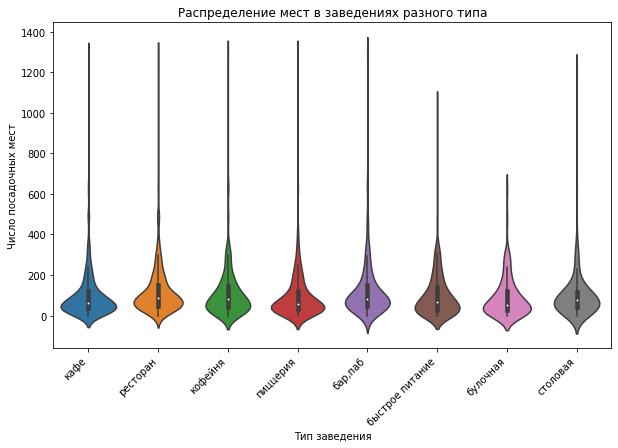

In [26]:
plt.figure(figsize= (10, 6))
sns.violinplot(y='seats', x='category', data=df)
plt.title(f'Распределение мест в заведениях разного типа')
plt.xlabel('Тип заведения')
plt.ylabel('Число посадочных мест')
plt.xticks(rotation=45, ha='right') # Поворот на 45 градусов значений по х оси
plt.show()


**Из имеющихся данных следует, что распределение числа посадочных мест имеет длинный хвост справа (это может быть следствием наличия банкетных залов в заведении или ошибкой в исходных данных). Во всех категориях межквартильный размах для всех заведений находится в диапазоне 25-150 посадочных мест. Больше всего посадочных мест в ресторанах и барах, пабах. Меньше всего в булочных и пиццериях. В датафрейме есть заведения с нулевым числом посадочных мест, скорее всего - это заведения типа "ларьков" с едой на вынос**

### Анализ сетевых и несетевых заведений
Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. 
Каких заведений больше?  
Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.  

In [27]:
# соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?  
fig = px.pie(df, values=df.groupby(by='chain')['name'].count(), names=['не сетевые', 'сетевые'],\
            title='Доля сетевых и несетевых заведений в Москве')
fig.update_layout(
    title={
        'text': 'Доля сетевых и несетевых заведений в Москве',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.4,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

In [28]:
# Какие категории заведений чаще являются сетевыми? 
data = df.groupby(by='category')['chain'].agg(['count', 'sum']).reset_index()
data['not_chain'] = data['count'] - data['sum']
data.columns = ['category', 'sum', 'is_chain', 'not_chain']
data['not_chain_ratio'] = (data['not_chain'] / data['sum']).round(2)
data['is_chain_ratio'] = (data['is_chain'] / data['sum']).round(2)
data = data.sort_values(by='is_chain_ratio', ascending=False)
# display(data)

#приведем датафрейм data к формату, где not_chаin и is_chain являются identifier variables (id_vars)
data_melted = data.melt(id_vars=['category'], value_vars=['is_chain_ratio', 'not_chain_ratio'], 
                        var_name='chain_status', value_name='ratio')


fig = px.bar(data_melted, x='category', y='ratio', color='chain_status', 
             title='Доля сетевых и несетевых заведений по разным категориям',
             text='ratio' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика)
            )
fig.update_layout(
    xaxis_title='Категория заведения',
    yaxis_title='Доля сетевых заведений',
    bargap=0.2
)

fig.show()

**Больше всего в Москве не сетевых заведений (61.9% против 38.1%). Доля сетевых заведений по категориям демонстрирует, что сети чаще характерны для булочных, пиццерий и кофеен (среди этих категорий более 50% заведений - сети). Чаще всего не сетевыми являются бары, пабы, столовые, кафе, рестораны и быстрое питание, здесь доля несетевых заведений выше 60%.**

### Топ-15 популярных сетей в Москве
Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве.  
Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?  

In [29]:
display(df.groupby(by='name').count()['category'].sort_values(ascending=False).head(15).reset_index())

,name,category
0,кафе,188
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
5,яндекс лавка,68
6,cofix,65
7,prime,50
8,хинкальная,44
9,шаурма,43


Помимо названий сетевых заведений при группировке видны "кафе" и "ресторан", которые не относятся к сетям, исключим их и построим график

In [30]:
# display(df.query('name != "кафе" and name != "ресторан"')
# .groupby(by='name').count()['category'].sort_values(ascending=False).head(15).reset_index()
# )

fig = px.bar(df.query('name != "кафе" and name != "ресторан"').groupby(by='name').count()['category'].sort_values(ascending=False).head(15).reset_index(),
            x='name', y='category', title='Топ-15 популярных сетей в Москве',
            text='category' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
fig.update_xaxes(title_text='Название заведения')
fig.update_yaxes(title_text='Число точек')
fig.update_layout(
    title={
        'text': 'Топ-15 популярных сетей в Москве',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

In [31]:
# извлечем список топ сетей для дальнейшей сортировки датафрейма
top_chain = df.query('name != "кафе" and name != "ресторан"').groupby(by='name').count()['category'].sort_values(ascending=False).head(15).reset_index()
top_chain = top_chain['name'].tolist()

# фильтруем исходный датафрейм только по 15 топовым сетям
top_chain_filtered = df[df['name'].isin(top_chain)]
top_chain_pivot = (top_chain_filtered.groupby(by='category')['name'].count().
                   reset_index().sort_values(by='name', ascending=False)
                  )
top_chain_pivot['ratio'] = (100 * top_chain_pivot['name'] / top_chain_pivot['name'].sum()).round(1)

top_chain_pivot

fig = px.bar(top_chain_pivot,
            x='category', y='ratio',
            text='ratio' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
fig.update_xaxes(title_text='Категория')
fig.update_yaxes(title_text='Доля от общего числа топовых заведений')
fig.update_layout(
    title={
        'text': 'Категории, к которым относятся топ-15 сетей Москвы',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

**Среди топ-15 популярных сетей в Москве знакомые Шоколадница, Додо Пицца, Cofix, One Price Coffee и т.д. Эти заведения чаще всего относятся к категориям "кофеен", "ресторанов" или "пиццерий". В общем и целом, в данных заведениях можно быстро, недорого перекусить, они часто встречаются в городе и легко доступны посетителям. Поэтому их популярность не является сюрпризом**

### Административные районы, анализ
Какие административные районы Москвы присутствуют в датасете?  
Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.  

In [32]:
print('\033[1mВ датафрейме представлены следующие районы:\033[1m')
districts = df.groupby(by='district')['name'].count().reset_index()
districts['short_name'] = ['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО']
districts.columns = ['district_name', 'food_points_number', 'short_name']
display(districts)
# соотношение заведений по районам  
fig = px.pie(df, values=df.groupby(by='district')['name'].count(), names=['ВАО', 'ЗАО', \
              'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'],\
            title='Доля заведений по районам Москвы')
fig.update_layout(
    title={
        'text': 'Доля заведений по районам Москвы',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

В датафрейме представлены следующие районы:


,district_name,food_points_number,short_name
0,Восточный административный округ,796,ВАО
1,Западный административный округ,850,ЗАО
2,Северный административный округ,897,САО
3,Северо-Восточный административный округ,890,СВАО
4,Северо-Западный административный округ,409,СЗАО
5,Центральный административный округ,2242,ЦАО
6,Юго-Восточный административный округ,714,ЮВАО
7,Юго-Западный административный округ,708,ЮЗАО
8,Южный административный округ,892,ЮАО


**В датасете присутствует информация о 9 районах Москвы: ЦАО, САО, ЮАО, СВАО, ЗАО, ВАО, ЮВАО, ЮЗАО, СЗАО. Причем в ЦАО больше всего заведений (26,7%), наименьшее же число заведений общепита в СЗАО (4,87%)**

In [33]:
pivot_df = pd.pivot_table(df, index=['district', 'category'], values='name', aggfunc='count').reset_index()

# создадим словарь с короткими названиями АО
district_short_names = {
    'Восточный административный округ': 'ВАО',
    'Западный административный округ': 'ЗАО',
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Северо-Западный административный округ':'СЗАО',
    'Центральный административный округ':'ЦАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО'
}

# добавим короткие название АО в сводную таблицу
pivot_df['district_short'] = pivot_df['district'].map(district_short_names)

#display(pivot_df)

fig = px.bar(pivot_df,
            x='district_short',
            y='name', 
            color='category',  # разделение категорий заведений по цветам
            title='Распределение заведений по категориям по районам Москвы',
            width=800,   # ширина графика
            height=500   # высота графика)
            )

fig.update_xaxes(title_text='Название района')
fig.update_yaxes(title_text='Число точек')
fig.update_layout(
    title={
        'text': 'Распределение заведений по категориям по районам Москвы',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

**При изучений категорий заведений по районам видно, что в Центральном районе больше всего (в абсолютных величинах) кафе, кофеен, баров и пабов, ресторанов (больше, чем в люом другом районе города). Меньше всего заведений в Северо-Западном АО. В других районах (ВАО, ЗАО, САО, СВАО, ЮВАО, ЮЗАО и ЮАО) примерно одинаковое число кафе (230-280), пиццерий (примерно по 70), ресторанов быстрого питания (60-80 заведений).**

### Средний рейтинг по категориям заведений
Визуализируйте распределение средних рейтингов по категориям заведений.  
Сильно ли различаются усреднённые рейтинги в разных типах общепита?
Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).  

In [34]:
#display(df.groupby(by='category')['rating'].mean().reset_index())
fig = px.line(df.groupby(by='category')['rating'].mean().reset_index(), 
              x='category', 
              y='rating', 
              markers=True) 

fig.update_layout(xaxis_title='Категория',
                 yaxis_title='Средний рейтинг',
                 title={
                    'text': 'Средний рейтинг для разных категорий общепита',
                    'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
                    'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
                })
fig.show() 


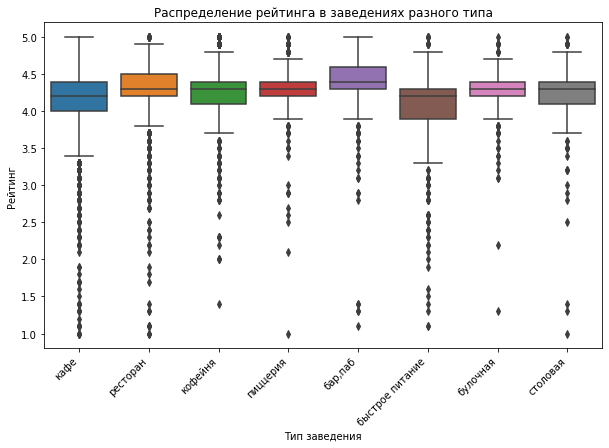

In [35]:
plt.figure(figsize= (10, 6))
sns.boxplot(y='rating', x='category', data=df)
plt.title(f'Распределение рейтинга в заведениях разного типа')
plt.xlabel('Тип заведения')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45, ha='right') # Поворот на 45 градусов значений по х оси
plt.show()

**Из визуализации распределения средних рейтингов по категориям заведений видно, что усреднённые рейтинги в разных типах общепита варьируются от 4.05 для заведений быстрого питания до 4.39 у баров и пабов.**  
**Распределение рейтинга по категориям, отображенное на графике boxplot выше демонстрирует, что у кафе и ресторанов быстрого питания обычно ниже рейтинг и шире межквартильный размах, чем у заведений других категорий. При этом почти у всех категорий есть значения возде единицы, реже всего такие низкие рейтинги встречаются у пиццерий, булочных, баров и пабов**

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.  

In [36]:
# читаем файл и сохраняем в переменной
# with open('/Users/darianechaeva/Downloads/admin_level_geomap.geojson', 'r') as f:
#     geo_json = json.load(f)

# print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

import requests

try:
    with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except FileNotFoundError:
    url = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
    response = requests.get(url)
    geo_json = response.json()
#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [37]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
display(rating_df.sort_values(by='rating', ascending=False))

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240803
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.173995
7,Юго-Западный административный округ,4.172881
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


**Фоновая картограмма (или хороплет) демонстрирует, что три района с самым высоким средним рейтингом - это ЦАО (средний рейтинг заведений 4.38), САО (4.24) и СЗАО (4.21). Хуже всего средний рейтинг у заведений, расположенных в ЮВАО (4.10) и СВАО (4.15).**

### Карта со всеми заведениями
Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.  

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**На карте выше отображены все заведения из имеющегося датасета**

### Топ-15 улиц по количеству заведений
Найдите топ-15 улиц по количеству заведений.  
Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.  

In [39]:
print('\033[1mТоп-15 улиц по числу заведений\033[1m')
top_streets = df.groupby(by='street')['name'].count().sort_values(ascending=False).head(15).reset_index()
display(top_streets)

# извлечем список топ улиц для дальнейшей сортировки датафрейма
top_streets = top_streets['street'].tolist()

# фильтруем исходный датафрейм только по 15 топовым улицам
filtered_df = df[df['street'].isin(top_streets)]

Топ-15 улиц по числу заведений


,street,name
0,проспект мира,183
1,профсоюзная улица,121
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [40]:
fig = px.bar(pd.pivot_table(filtered_df, index=['street', 'category'], values='name', aggfunc='count').reset_index(),\
            x='street',
            y='name', 
            color='category',  # разделение категорий заведений по цветам
            title='Распределение заведений по категориям по улицам Москвы',
            width=800,   # ширина графика
            height=500   # высота графика)
            )

fig.update_xaxes(title_text='Название улицы')
fig.update_yaxes(title_text='Число точек')
fig.update_layout(
    title={
        'text': 'Распределение заведений по категориям по улицам Москвы',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

**В этой части исследования установили топ-15 улиц по количеству заведений и построили график распределения количества заведений и их категорий по этим улицам. Так Проспект Мира лидирует по общему числу заведений (183), а на 15-м месте располагается Пятницкая улица с 48 заведениями общественного питания. Стоит отметить, что среди этих улиц находятся одни из самых длинных в Москве, например, Варшавское шоссе длится 22,5 км, а Профсоюзная улица простирается на 14 км**

### Улицы, на которых находится только один объект общепита
Найдите улицы, на которых находится только один объект общепита.  
Что можно сказать об этих заведениях?  

In [41]:
one_street = df.groupby(by='street')['name'].count().reset_index()
# display(one_street[one_street['name'] == 1].head())

# извлечем список топ улиц для дальнейшей сортировки датафрейма
one_street[one_street['name'] == 1]['street'].tolist()

# фильтруем исходный датафрейм только по улицам c 1 заведением 
one_street_df = df[df['street'].isin(one_street[one_street['name'] == 1]['street'].tolist())]

#display(one_street_df.groupby(by='category')['name'].count())

fig = px.pie(one_street_df, values=one_street_df.groupby(by='category')['name'].count(), names=sorted(one_street_df['category'].unique()),\
            title='Типы заведений на улицах с одним объектом общепита')
fig.update_layout(
    title={
        'text': 'Типы заведений на улицах с одним объектом общепита',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()


In [42]:
print(f"\033[1mЧисло улиц, на котрых находится одно заведение:{len(one_street[one_street['name'] == 1])}\033[1m")

Число улиц, на котрых находится одно заведение:457


In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
one_street_df.apply(create_clusters, axis=1)

# выводим карту
m

**Улиц, на которых находится только один объект общепита, всего 457, можно сказать что чаще всего на них расположены кафе, рестораны и кофейни, кроме того эти заведения скорее всего расположены на очень коротких улицах**  

### Анализ средних чеков
Значения средних чеков заведений хранятся в столбце middle_avg_bill.
Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?  

In [44]:
median_bill = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
display(median_bill.sort_values(by='middle_avg_bill', ascending=False))


# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

# выводим карту
m

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


**Из карты выше видно, что самый высокий средний чек (1000 р) приходится на Центральный АО и Западный АО, однако не все районы за пределами ЦАО имеют одинаковый средний чек. Так, например, на северо-западе Москвы средний цек выше, чем на северо-востоке, а на юге выделяется более высоким чеком Юго-Западный АО (средний чек 600 р), а в соседствующих с ЮЗАО Южном и Юго-Восточном АО средний чек 500 и 450 р. Можно сказать, что на средний чек в большей степени влияет не удаленность от центра, а географическое положение заведения** 

### Часы работы заведений Москвы

Изучим, какие категории заведений чаще всего работают круглосуточно, каждый день и где они расположены на карте Москвы

In [45]:
rest_24 = df.query('is_24_7 == True').groupby(by='category')['is_24_7'].count().reset_index().sort_values(by='is_24_7', ascending=False)
display(rest_24)
fig = px.pie(rest_24,
            values=rest_24['is_24_7'],
            names=rest_24['category'],
            title='Доля круглосуточных заведений в Москве в зависимости от их типа')
fig.update_layout(
    title={
        'text': 'Доля круглосуточных заведений в Москве в зависимости от их типа',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.6,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()



,category,is_24_7
3,кафе,267
2,быстрое питание,150
6,ресторан,135
4,кофейня,59
0,"бар,паб",52
5,пиццерия,31
1,булочная,24
7,столовая,12


**Ежедневно и круглосуточно в Москве работают чаще всего кафе (36.6% от общего числа круглосуточных заведений), рестораны быстрого питания (20,5%), и рестораны (18.5%).** 

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('is_24_7 == True').apply(create_clusters, axis=1)

# выводим карту
m

**Все круглосуточные заведения расположены в пределах МКАД, в т.ч. на ж/д вокзалах, но не в аэропортах. Не редко круглосуточно работают заведения, предлагающие кебаб, шаурму или кофе**

### Расстояние до метро

Проанализируем как расстояние до метро (данные по координатам станций метро взяты из [Википедии](https://ru.wikipedia.org/wiki/%D0%9A%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D1%8F:%D0%A1%D1%82%D0%B0%D0%BD%D1%86%D0%B8%D0%B8_%D0%9C%D0%BE%D1%81%D0%BA%D0%BE%D0%B2%D1%81%D0%BA%D0%BE%D0%B3%D0%BE_%D0%BC%D0%B5%D1%82%D1%80%D0%BE%D0%BF%D0%BE%D0%BB%D0%B8%D1%82%D0%B5%D0%BD%D0%B0)) влияет на средний чек, а также посмотрим, ближе ли к метро, заведения, работающие круглосуточно

In [47]:
def extract_coordinates_from_kml(kml_url):
    # Парсинг KML файла
    response = requests.get(kml_url)
    #kml_content = response.content
    #tree = ET.parse(kml_content)
    root = ET.fromstring(response.content)
    
    # путь к namespace
    namespace = {'kml': "http://earth.google.com/kml/2.1"}
    
    # извлекаем координаты
    coordinates = []
    for coord in root.findall('.//kml:coordinates', namespace):
        coordinates.append(coord.text.strip())
    
    return coordinates

# путь к KML файлу
kml_url = 'https://tinyurl.com/ysvxkt4w'

# записываем координаты в переменную
metro_stations = extract_coordinates_from_kml(kml_url)

In [48]:
# конвертируем list к numpy array (n_stations, 2)
metro_coords = np.array([(float(coord.split(',')[1]), float(coord.split(',')[0])) for coord in metro_stations])

# конвертируем координаты из датафрейма (нашего) в numpy array of shape (n_samples, 2)
df_coords = df[['lat', 'lng']].values


In [49]:
# функция для расчета расстояния в метрах между координатами
def haversine_distance_matrix(coords1, coords2):
    # конвертация в радианы
    coords1 = np.radians(coords1)
    coords2 = np.radians(coords2)

    lat1, lon1 = np.split(coords1, 2, axis=1)
    lat2, lon2 = np.split(coords2, 2, axis=1)

    dlat = lat2.T - lat1
    dlon = lon2.T - lon1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2.T) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))

    # Радиус Земли в метрах: 6371000
    return 6371000 * c

# Считаем расстояние между координатами метро и координатами датафрейма
dist_matrix = haversine_distance_matrix(df_coords, metro_coords)

# находим минимальное раастояние для каждой строчки в нашем датафрейме и записываем в добавленную колонку
df['dist_to_metro'] = np.min(dist_matrix, axis=1)

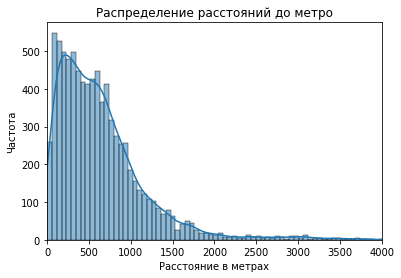

In [50]:
# строим гистограмму для столбца dist_to_metro, добавив график кривой KDE
sns.histplot(x='dist_to_metro', data=df, kde=True)

plt.xlim(0, 4000)
plt.title('Распределение расстояний до метро')
plt.xlabel('Расстояние в метрах')
plt.ylabel('Частота')
plt.show()

**Большинство заведений нашего датасета расположены от метро в пределах 1 км, у распределения длинный хвост справа, соответственно есть заведения, расположенные от метро сильно дальше оcтальных**

In [51]:
# # посмотрим как расстояние до метро влияет на средний чек
fig = px.scatter(df,             
                 x='dist_to_metro', 
                 y="middle_avg_bill"  
                 ) 

fig.update_xaxes(range=[0, 4000])  # ограничим ось х
fig.update_yaxes(range=[0, 5000]) # ограничим ось у
fig.update_layout(title='Зависимость среднего чека от расстояния до метро',
                   xaxis_title='Расстояние до метро, м',
                   yaxis_title='Средний чек')

fig.show() 

**Зависимость среднего чека от расстояния до метро демонстрирует, что заведения, раположенные дальше от метро обычно имеют меньший чек**

Теперь посмотрим, ближе ли к метро заведения, работающие круглосуточно

In [52]:
# df.groupby('is_24_7')['dist_to_metro'].median().reset_index()
fig = px.bar(df.groupby('is_24_7')['dist_to_metro'].median().reset_index().round(1),
            x='is_24_7',
            y='dist_to_metro',
            title='Медианное расстояние до метро заведений, работающих круглосуточно (True) и нет (False)',
            width=850,   # ширина графика
            height=400,
            text='dist_to_metro' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
fig.update_xaxes(title_text='График работы заведения')
fig.update_yaxes(title_text='Медианное расстояние до метро')
fig.update_layout(
    title={
        'text': 'Медианное расстояние до метро заведений, работающих круглосуточно (True) и нет (False)',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
 
fig.show()

**Заведения, работающие круглосуточно и ежедневно не расположены ближе к метро, относительно заведений с другим графиком. Значения медиан очень близки друг к другу**

## Conclusions on Food Service Establishments in Moscow
<a id='conclusions-on-food-service-establishments-in-moscow'></a>

1. The dataset contains 8,406 rows and 5,614 unique establishments, with a total of 13 columns. About 0.01% of the data are duplicates, which were removed. Almost half of the columns contain missing values; in the `price`, `avg_bill`, and `seats` columns, the share of missing values reaches up to 60% of the total data. In addition, the column with the number of seats has an incorrect data type (floating-point instead of integer, since the number of seats should always be an integer). All missing values were left unchanged, as filling them could distort the statistical properties of the data. During preprocessing, new columns with street names were added, as well as a boolean column indicating whether an establishment operates daily and 24/7.

2. The dataset includes information on 9 administrative districts of Moscow: CAO, NAO, SAO, NEAD, WAD, EAD, SEAD, SWAD, and NWAD. The largest share of establishments is located in the Central Administrative District (26.7%), while the smallest share is in the North-Western Administrative District (4.87%). Cafes (28.3%) and restaurants (24.3%) are the most common types of establishments in Moscow, while canteens and bakeries are the least common (around 3% each).

3. The distribution of the number of seats has a long right tail, which may be caused by the presence of banquet halls or errors in the source data. Across all categories, the interquartile range of seating capacity lies between 25 and 150 seats. Restaurants and bars/pubs have the largest number of seats, while bakeries and pizzerias have the fewest. The dataframe also contains establishments with zero seats, which are most likely takeaway-only outlets.

4. Non-chain establishments dominate in Moscow (61.9% versus 38.1%). The share of chain establishments by category shows that chains are more common among bakeries, pizzerias, and coffee shops (over 50% of establishments in these categories are chains). Bars, pubs, canteens, cafes, restaurants, and fast-food outlets are more often non-chain, with over 60% being independent. Among the top 15 most popular chains in Moscow are well-known brands such as Shokoladnitsa, Dodo Pizza, Cofix, One Price Coffee, and others. These establishments typically fall into the “cafe,” “fast food,” or “pizzeria” categories and offer quick, affordable meals, which explains their popularity.

5. Analyzing establishment categories by district shows that the Central Administrative District has the highest absolute number of cafes, coffee shops, bars and pubs, and restaurants—more than any other district in the city. The North-Western Administrative District has the fewest establishments. Other districts (EAD, WAD, NAO, NEAD, SEAD, SWAD, and SAO) have a relatively similar number of cafes (230–280), pizzerias (around 70), and fast-food restaurants (60–80).

6. Visualization of average ratings by establishment category shows that mean ratings range from 4.05 for fast-food establishments to 4.39 for bars and pubs. A background choropleth map indicates that the three districts with the highest average ratings are CAO (4.38), NAO (4.24), and NWAD (4.21). The lowest average ratings are observed in SEAD (4.10) and NEAD (4.15). Rating distributions by category indicate that cafes and fast-food restaurants tend to have lower ratings and wider interquartile ranges compared to other categories. At the same time, nearly all categories include ratings close to 1, though such low values are least common among pizzerias, bakeries, bars, and pubs.

8. Among the top 15 streets by number of food service establishments are Prospekt Mira, Profsoyuznaya Street, Vernadsky Prospekt, Leninsky Prospekt, and Leningradsky Prospekt, while Pyatnitskaya Street ranks 15th with 48 establishments. It is worth noting that many of these streets are among the longest in Moscow; for example, Varshavskoye Shosse is 22.5 km long, and Profsoyuznaya Street stretches for 14 km.

9. There are 457 streets with only one food service establishment. These are most often cafes, restaurants, or coffee shops and are likely located on very short streets.

10. The highest average bill (around 1,000 RUB) is observed in the Central and Western Administrative Districts. However, districts outside CAO differ significantly in average bill levels. For example, the north-west of Moscow has a higher average bill than the north-east, while in the south, the South-Western Administrative District stands out with a higher average bill (600 RUB), compared to neighboring Southern and South-Eastern districts (500 and 450 RUB, respectively). This suggests that average bill size is influenced more by geographic location than by distance from the city center. Additionally, the relationship between average bill and distance to the metro shows that establishments located farther from metro stations generally have lower average bills.

11. All 24/7 establishments are located within the Moscow Ring Road (MKAD), including those at railway stations, but not at airports. Establishments offering kebabs, shawarma, or coffee are among the most common 24/7 venues. Establishments operating 24/7 and daily are not locat


## Шаг 4. Детализируем исследование: открытие кофейни
<a id='шаг-4-детализируем-исследование-открытие-кофейни'></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.  

Ответьте на следующие вопросы:
### Сколько всего кофеен в датасете? 

In [53]:
cafe = df.query('category == "кофейня"') # отсортируем датафрейм так, чтобы остались только кофейни
#caffee.info() # посомотрим на общую информацию об этом датасете
print(f'\033[1mВсего в датафрейме {df[df["category"] == "кофейня"].shape[0]} кофеен\033[1m')

Всего в датафрейме 1413 кофеен


### Распределение кофеен по районам
В каких районах их больше всего, каковы особенности их расположения?  

In [54]:
#print('\033[1mЧисло кофеен в разных районах Москвы\033[1m')
cafe_pivot = cafe.groupby(by='district')['name'].count().reset_index().sort_values(by='name', ascending=False)

# создадим словарь с короткими названиями АО
district_short_names = {
    'Восточный административный округ': 'ВАО',
    'Западный административный округ': 'ЗАО',
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Северо-Западный административный округ':'СЗАО',
    'Центральный административный округ':'ЦАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО'
}

# добавим короткие название АО в сводную таблицу
cafe_pivot['district_short'] = cafe_pivot['district'].map(district_short_names)

# display(cafe_pivot)


fig = px.bar(cafe_pivot,
            x='district_short',
            y='name', 
            #color='category',  # разделение категорий заведений по цветам
            title='Распределение кофеен по районам Москвы',
            width=800,   # ширина графика
            height=500,   # высота графика
            text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )

fig.update_xaxes(title_text='Название района')
fig.update_yaxes(title_text='Число кофеен')
fig.update_layout(
    title={
        'text': 'Распределение кофеен по районам Москвы',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.4,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()

**Больше всего кофеен, как и других заведений общепита, в Центральном АО (примерно в 2 раза больше, чем в других районах). Меньше всего в Северо-Западном АО.**  
  
Отобразим кофейни на карте, чтобы изучить особенности расположения

In [55]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.apply(create_clusters, axis=1)

# выводим карту
m

**Если посмотреть на плотность населения по АО Москвы (например, [тут](https://ru.wikipedia.org/wiki/%D0%90%D0%B4%D0%BC%D0%B8%D0%BD%D0%B8%D1%81%D1%82%D1%80%D0%B0%D1%82%D0%B8%D0%B2%D0%BD%D0%BE-%D1%82%D0%B5%D1%80%D1%80%D0%B8%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%D1%8C%D0%BD%D0%BE%D0%B5_%D0%B4%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D0%B5_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B)), то выясняется, что самыми густонаселенными районами являются СВАО, ЮАО, ЮЗАО, ЮВАО, ЦАО. [Проходимость](https://nakarte.me/#m=10/55.76035/37.64877&l=O/Sr&q=moscow) во всх районах Москвы, за исключением части ЮАО высокая, можно рассмотреть размещение кофейни в СВАО, СЗАО, ЮЗАО, ЮВАО, так как число кофеен там от 60 до 160 на район.**


### Есть ли круглосуточные кофейни?  

In [56]:
cafe_24_7 = cafe.groupby(by='is_24_7')['name'].count().reset_index()
cafe_24_7['work_type'] = ['Другой график', 'Ежедневно, круглосуточно']
cafe_24_7
# соотношение кофеен по графику работы 
fig = px.pie(cafe_24_7, values=cafe_24_7['name'], names=cafe_24_7['work_type'],
            title='Доля кофеен в Москве в зависимости от графика работы')
fig.update_layout(
    title={
        'text': 'Доля кофеен в Москве в зависимости от графика работы',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
fig.show()


**Да, в Москве есть круглосуточные кофейни, их доля от общего числа кофеен меньше 5%. Нанесем их на карту и посмотрим, есть ли у них какое-то особое географическое положение, объясняющее их круглосуточный график работы**

In [57]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafe.query('is_24_7 == True').apply(create_clusters, axis=1)

# выводим карту
m

In [58]:
# какова доля сетей в круглосуточных заведениях
cafe.query('is_24_7 == True')['chain'].value_counts()

1    50
0     9
Name: chain, dtype: int64

**Какого-то логичного местоположения круглосуточным кофейням найти не удалось, они не расположены в аэропортах или ж/д вокзалах. Большая часть круглосуточных кофеен являются сетями (50 против 9 заведений), например, Шоколадница, Cofix и т.п. В целом, несмотря на низкую конкуренцию в сегменте круглосуточных кофеен, рекомендуется учесть, что вашими конкурентами станут устойчивые, сетевые кофейни.**

### Какие у кофеен рейтинги? Как они распределяются по районам?.

In [59]:
rating_cafe = cafe.groupby('district', as_index=False)['rating'].agg('mean')
display(rating_cafe.sort_values(by='rating', ascending=False))

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


**У кофеен довольно высокий средний рейтинг. При рассмотрении среднего рейтинга по административным округам, он варьируется от 4.3 в ЦАО и СЗАО до 4.2 в ЮАО, ЮВАО, СВАО, ЗАО. Исходя из рейтинга, можно предположить, что наличие хорошей новой кофейни было бы заметно для посетителей, живущих или работающих в ЗАО, СВАО, ЮВАО и ЮАО.**

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


In [60]:
median_cafe = cafe.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
print('\033[1mМедианная цена чашки кофе по административным районам Москвы\033[1m')
display(median_cafe.sort_values(by='middle_coffee_cup', ascending=False))


# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_cafe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе по районам',
).add_to(m)

# выводим карту
m

Медианная цена чашки кофе по административным районам Москвы


,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [61]:
# посмотрим на данные по стоимости чашки кофе внимательнее
cafe.groupby('district')['middle_coffee_cup'].describe()

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Восточный административный округ,42.0,174.023810,225.384710,60.0,106.25,135.0,177.50,1568.0
Западный административный округ,49.0,189.938776,74.227243,60.0,130.00,189.0,256.00,300.0
Северный административный округ,76.0,165.789474,62.668081,60.0,133.00,159.0,204.25,325.0
Северо-Восточный административный округ,60.0,165.333333,63.644049,60.0,123.00,162.5,201.25,297.0
Северо-Западный административный округ,21.0,165.523810,60.797713,60.0,124.00,165.0,200.00,270.0
Центральный административный округ,162.0,187.518519,67.263201,60.0,139.00,190.0,250.00,328.0
Юго-Восточный административный округ,34.0,151.088235,62.421523,60.0,112.50,147.5,173.75,375.0
Юго-Западный административный округ,34.0,184.176471,57.536007,95.0,129.00,198.0,229.25,291.0
Южный административный округ,43.0,158.488372,66.133117,60.0,107.50,150.0,202.50,275.0


**Рекомендуемая стоимость чашки кофе зависит от района, в котором будет открыта кофейня, рекомендуется не устанавливать ее выше 200 р. Самая высокая стоимость наблюдается для ЮЗАО и ЦАО (200 р), а самая низкая для ВАО (135 р за чашку). Рекомендуется устанавливать цену за чашку кофе для других районов исходя из таблицы "Медианная цена чашки кофе по административным районам Москвы"**

### Расстояние до метро для кофеен

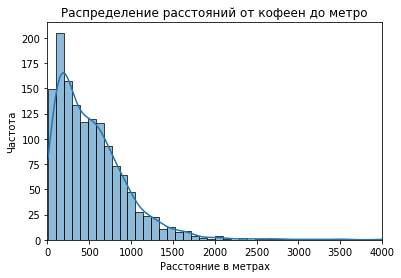

In [62]:
# строим гистограмму для столбца dist_to_metro, добавив график кривой KDE
sns.histplot(x='dist_to_metro', data=cafe, kde=True)

plt.xlim(0, 4000)
plt.title('Распределение расстояний от кофеен до метро')
plt.xlabel('Расстояние в метрах')
plt.ylabel('Частота')
plt.show()

**Чаще всего кофейни располагаются в 200 метрах от метро, большинство кофеен удалено от станции в пределах 1 км**

In [63]:
# # посмотрим как расстояние до метро влияет на средний чек
fig = px.scatter(cafe,             
                 x='dist_to_metro', 
                 y="middle_coffee_cup"  
                 ) 

#fig.update_xaxes(range=[0, 4000])  # ограничим ось х
fig.update_yaxes(range=[0, 500]) # ограничим ось у
fig.update_layout(title='Зависимость средней цены чашки кофе от расстояния до метро',
                   xaxis_title='Расстояние до метро, м',
                   yaxis_title='Средняя цена чашки кофе')

fig.show() 

**Средняя цена чашки кофе тем выше, чем ближе заведение к метро, но большинство заведений предлагают кофе по цене, не превышающей 300 р.**

In [64]:
#cafe.groupby('is_24_7')['dist_to_metro'].median().reset_index()
fig = px.bar(cafe.groupby('is_24_7')['dist_to_metro'].median().reset_index().round(1),
            x='is_24_7',
            y='dist_to_metro',
            title='Медианное расстояние от кофеен, работающих круглосуточно (True) и нет (False) до метро',
            width=850,   # ширина графика
            height=400,
            text='dist_to_metro' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
fig.update_xaxes(title_text='График работы кафе')
fig.update_yaxes(title_text='Медианное расстояние до метро')
fig.update_layout(
    title={
        'text': 'Медианное расстояние от кофеен, работающих круглосуточно (True) и нет (False) до метро',
        'y': 0.95,  # Vertical position of the title (0.0 - bottom, 1.0 - top)
        'x': 0.5,   # Horizontal position of the title (0.0 - left, 1.0 - right)
    }
)
 
fig.show()

**На графике видно, что в среднем кофейни, работающие круглосуточно, расположены ближе к метро, поэтому если принимается решение об открытии круглосуточной кофейни, лучше арендовать помещение, расположенное недалеко от метро**

## Conclusions on Coffee Shops  
<a id='coffee-shop-conclusions'></a>

1. The dataframe contains a total of 1,413 coffee shops.

2. The highest number of coffee shops, as well as other food service establishments, is located in the Central Administrative District (CAO), approximately twice as many as in other districts. The lowest number is in the North-Western Administrative District (NWAD).

3. If we look at population density by Moscow administrative districts (for example, [here](https://ru.wikipedia.org/wiki/%D0%90%D0%B4%D0%BC%D0%B8%D0%BD%D0%B8%D1%81%D1%82%D1%80%D0%B0%D1%82%D0%B8%D0%B2%D0%BD%D0%BE-%D1%82%D0%B5%D1%80%D1%80%D0%B8%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%D1%8C%D0%BD%D0%BE%D0%B5_%D0%B4%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D0%B5_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B)), the most densely populated districts are NEAD, SAD, SWAD, SEAD, and CAO. Foot traffic is high in almost all districts of Moscow (except parts of the Southern AD). Therefore, opening a coffee shop in NEAD, NWAD, SWAD, or SEAD could be considered, as the number of coffee shops there ranges from 60 to 160 per district.

4. There are 24/7 coffee shops in Moscow, but they account for less than 5% of all coffee shops. These 24/7 coffee shops are not located in airports or railway stations. On average, 24/7 coffee shops are located closer to metro stations; therefore, if opening a 24/7 coffee shop is considered, it is recommended to rent premises near a metro station. Most 24/7 coffee shops belong to chains (50 chain locations versus 9 independent ones), such as Shokoladnitsa, Cofix, and others. Overall, despite relatively low competition in the 24/7 segment, it is important to consider that competitors will primarily be established chain coffee shops.

5. Coffee shops have a relatively high average rating. When analyzing average ratings by administrative district, they range from 4.3 in CAO and NWAD to 4.2 in SAD, SEAD, NEAD, and WAD. Based on ratings, it can be assumed that opening a high-quality new coffee shop would be noticeable and in demand among residents and workers in WAD, NEAD, SEAD, and SAD.

6. The recommended price for a cup of coffee depends on the district where the coffee shop is opened and should not exceed 200 RUB. The highest prices are observed in SWAD and CAO (around 200 RUB), while the lowest are in EAD (approximately 135 RUB per cup). Additionally, the closer a coffee shop is to a metro station, the higher the average coffee price; however, most establishments price coffee at no more than 300 RUB.

7. Since operating costs for a coffee shop also include rent, it is not recommended to open a coffee shop in CAO and WAD, where rental prices are significantly higher compared to other districts. NEAD, NWAD, SEAD, and SWAD should be considered as potential districts for opening a coffee shop.

8. Most coffee shops are located within 200 meters of a metro station, and the majority are within 1 km of a station.
